In [1]:
import sys
# Change to wherever you've copied the repo.
sys.path.insert(1, '/home/richard/nfmc_jax/')
import nfmc_jax
import arviz as az
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import scipy
from sklearn.neighbors import KernelDensity
import jax
import jax.numpy as jnp
from jax.scipy.special import logsumexp
from jax.scipy.stats import multivariate_normal as mvn
from scipy.stats import multivariate_normal as n_mvn
import chaospy
import corner
import torch
import warnings
import pickle

import getdist
from getdist import plots, MCSamples

seed=1234
np.random.seed(seed)
key = jax.random.PRNGKey(seed)

# Sampling a 32-d banana

In [2]:
from scipy.stats import special_ortho_group

n = 32 # number of dims
Q = 0.1
lower = np.full(n, -15) # lower bound of the prior
upper = np.full(n, 15) # upper bound of the prior

bounds = np.array([lower, upper])
#bounds = None

# Not doing this for now ...
np.random.seed(0)
A = special_ortho_group.rvs(n) # random rotation of the bananas

def log_like(x):
    #x = jnp.matmul(x, jnp.transpose(A))
    return -jnp.sum((x[..., ::2]**2 - x[..., 1::2])**2 / Q + 
                    (x[..., ::2] - 1)**2, axis=-1)

def log_prior(x):
    #return jnp.sum(jax.scipy.stats.uniform.logpdf(x, loc=lower, scale=upper-lower))
    return jax.scipy.stats.multivariate_normal.logpdf(x, mean=jnp.zeros(n), cov=6**2*jnp.eye(n))
    
def prior_rvs(key, N):
    return jax.random.multivariate_normal(key, shape=(N,), mean=jnp.zeros(n),
                                          cov=3**2*jnp.eye(n))

#jax_prior_init = jax.random.uniform(key, shape=(128, n), minval=lower, maxval=upper)
jax_prior_init = jax.random.multivariate_normal(key, shape=(20,), mean=jnp.zeros(n),
                                                cov=3**2*jnp.eye(n))

print(jnp.shape(jax_prior_init))

log_like_grad = jax.grad(log_like)
log_prior_grad = jax.grad(log_prior)

(20, 32)


Below I have defined the key parameters that I think you will need to worry about. If you look at the actual code you'll see a lot more parameters. Some of these are from older versions of the algorithm, and some of these are only relevant for the NFO optimization algorithm. We'll tidy this up at some point, but this should be enough to get you going.

In [3]:
'''
General parameters
------------------
In addition to the log-likelihood and prior functions defined above that you'll pass, we have:

1. log_like_args: Any additional arguments to be passed to the log-likelihood function as a tuple object.
2. log_prior_args: As above but for the prior. Not necessary here, but I've included arguments for illustration.
3. inference_mode: Either 'optimization' or 'sampling'. You'll want 'sampling'.
4. vmap: If True we evaluate the log-likelihood and prior functions using a vectorizing map (i.e. jax.vmap). 
   If False we parallelise the computation over available cores. The parallelisation has been tested on NERSC, 
   but I've pretty much exclusively been using vmap (you may want to parallelise if you have some very expensive 
   likelihoods).
5. parallel_backend: If using parallel evaluations, choose the parallel backend. Can be set to Pool, Client or
   MapReduce. Will use multiprocess, dask or sharedmem respectively. If left as None, will use multiprocess.
6. bounds: Any hard parameter bounds to pass to SINF/SNF. Passed as array([lower_bounds, upper_bounds]). None
   if no hard bounds.
7. k_trunc: Clipping parameter for importance weights. IW clipped at <IW>*N^k_trunc. Note, not currently used
   with SMC-type sampling.
8. random_seed: Random seed for inference.
'''
log_like_args = ()
log_prior_args = () 
inference_mode = 'DLA'
vmap = True
parallel_backend = None
bounds = None
k_trunc = 0.25
random_seed = seed

'''
SINF/SNF parameters
---------------
Key SINF/SNF parameters. See GIS.py, SINF.py and optimize.py for code.

1. alpha_w: Regularisation parameters for weighted q SINF fits. Passed as a tuple of two values between 0 and 1. 
   Closer to 1 will give more regularisation. If set to None, SINF uses cross-validation to choose a value.
2. NBfirstlayer: Whether to use a Naive Bayes first layer in SINF.
3. verbose: Whether you want verbose output from SINF.
4. interp_nbin: Number of spline knots for rational quadratic splines in SINF. 
5. trainable_qw: Whether to run SNF after SINF. This was relevant when SINF and SNF were contained in the same
   method. There are separate methods now, and I'm using this so I can more easily change things. You should
   probably leave this as False for now. It won't break anything if you set it as True. Just means you'll run 
   SNF one more time than you think.
6. sgd_steps: Number of stochastic gradient descent steps to take for SNF training.
7. gamma: Parameter in loss function 1 (log E(q^(-gamma)*(p - Zq)^2)). 
8. knots_trainable: Only relevant if trainable_qw is True, in which case this overwrites interp_nbin.
9. optimize_directions: Whether we optimize directions in SNF.
10. logp_cut: logp threshold to be applied during SNF training. Currently I don't impose a cut.
11. edge_bins: Number of spline knots at the boundary.
12. Whiten: Whether to include a whitening layer for SINF.
13. iteration: Maximum number of SINF layers.
'''
#sinf parameters
alpha_w = (0.0, 0.98)
NBfirstlayer = True
verbose = False
interp_nbin = 20
trainable_qw = False # Just leave this for now.
sgd_steps = 0
gamma = 0
knots_trainable = 20
optimize_directions = False
logp_cut = None
edge_bins = 0
Whiten = False
Whiten_with_weights = False
iteration = 20
NERCOME = False
frac_validate = 0.2
t_ess = 0.5

'''
SMC parameters
--------------
Parameters used for SMC and MH exploration strategies.

1. nfmc_frac_validate: Fraction of samples used in validation for SINF/SNF.
2. min_delta_beta_init: Minimum relative change in beta at start.
3. min_delta_beta_final: Minimum relative change in beta at end. delta_beta decays to this between start and end.
4. snf_loss: Specify the SNF loss function. (0) E(q^(-gamma)*(p - Zq)^2), (1) log E(q^(-gamma)*(p - Zq)^2),
   (2) sum((logp-logq-logZ)^2), (3) -E(logq), (4) log(E((q/q_uw)(p/q - Z)^2)).
5. nfmc_snf_only: Whether to only use trainable SNF updates to q after the first q fit.
6. fixed_beta_schedule: Can specify a fixed beta schedule as a list of beta values.
7. vanilla_smc: Whether to use the SMC+MH exploration strategy. This is currently the focus for sampling.
   Old option was to intialise using NFO optimization.
8. reg: SNF regularisation parameter.
9. reg1: SNF regularisation parameter.
10. mh_mode: Specify 'IMH' for independent MH exploration, 'CMH' for latent space MH, 'both' for using both.
    CMH is still being tested so stick with 'IMH' for now.
11. imh_target_acc_rate: Target acceptance fraction for original samples in IMH.
12. max_imh_steps: Maximum number of IMH iterations at a given temperature level.
13. cmh_target_acc_rate: Target acceptance rate for CMH exploration.
14. max_cmh_steps: Maximum number of steps in a CMH chain.
15. cmh_p_acc_rate: Parameter used for tuning number of CMH steps. Between 0 and 1. Closer to 1 results in more
    steps.
16. sinf_resampled: Whether to fit SINF using re-sampled samples and uniform weight.
'''
nfmc_frac_validate = 0.0
frac_validate = 0.2
min_delta_beta_init = 0.01
min_delta_beta_final = 0.01
snf_loss = 3
nfmc_snf_only = False
fixed_beta_schedule = None
vanilla_smc = True
reg = 0.0
reg1 = 0.5
reg2 = 0.5
latent_mcmc = 'LIMH'
imh_target_acc_rate = 0.5
max_imh_steps = 25
cmh_target_acc_rate = 0.234
max_cmh_steps = 25
cmh_p_acc_rate = 0.85
sinf_resampled = True
fixed_beta_updates = 'LIMH'
nf_iter = 25
slice_iterations = 10

dla_step_size = 1.0
num_extra_dla_samples = 44
grad_norm_thresh = 0.1
max_dla_line_steps = 2
log_like_grad = log_like_grad
log_prior_grad = log_prior_grad
eps_z = 0.2
accelerate_dla = False
grad_free_dla = False
dla_beta_thresh = 0.5
latent_dla = True
rel_fish_tol = 1e-2
abs_fish_tol = 1e-3
maxknot = False

max_dla_iter = 200

flow_type = 'SINF'
maf_layers = 10
maf_hidden = 5
maf_activation = torch.sigmoid
dropout_prob = 0.2
maf_epochs = 200

mala_step_size = 1.0
num_mala = 0
tune_mala = 50

cull_lowp_tol = 1e-2

Now we can run our 10d Gaussian example.

In [4]:
trace = nfmc_jax.infer_nfomc(log_like_func=log_like, 
                             log_prior_func=log_prior,
                             prior_rvs_func=prior_rvs,
                             init_samples=jax_prior_init, 
                             log_prior_args=log_prior_args, 
                             inference_mode=inference_mode, 
                             vmap=vmap, 
                             parallel_backend=parallel_backend, 
                             bounds=bounds,
                             k_trunc=k_trunc,
                             frac_validate=frac_validate,
                             #sinf parameters
                             alpha_w=alpha_w,
                             NBfirstlayer=NBfirstlayer, 
                             verbose=verbose,
                             interp_nbin=interp_nbin,
                             iteration=iteration,
                             trainable_qw=trainable_qw,
                             sgd_steps=sgd_steps,
                             gamma=gamma,
                             knots_trainable=knots_trainable,
                             optimize_directions=optimize_directions,
                             logp_cut=logp_cut,
                             random_seed=seed,
                             edge_bins=edge_bins,
                             Whiten=Whiten,
                             Whiten_with_weights=Whiten_with_weights,
                             #SMC parameters
                             nfmc_frac_validate=nfmc_frac_validate,
                             min_delta_beta_init=min_delta_beta_init,
                             min_delta_beta_final=min_delta_beta_final,
                             snf_loss=snf_loss,
                             nfmc_snf_only=nfmc_snf_only,
                             fixed_beta_schedule=fixed_beta_schedule,
                             vanilla_smc=vanilla_smc,
                             reg=reg,
                             reg1=reg1,
                             reg2=reg2,
                             latent_mcmc=latent_mcmc,
                             imh_target_acc_rate=imh_target_acc_rate,
                             max_imh_steps=max_imh_steps,
                             cmh_target_acc_rate=cmh_target_acc_rate,
                             max_cmh_steps=max_cmh_steps, 
                             cmh_p_acc_rate=cmh_p_acc_rate,
                             NERCOME=NERCOME,
                             slice_iterations=slice_iterations,
                             dla_step_size=dla_step_size,
                             num_extra_dla_samples=num_extra_dla_samples,
                             grad_norm_thresh=grad_norm_thresh,
                             log_like_grad=log_like_grad,
                             log_prior_grad=log_prior_grad,
                             max_dla_line_steps=max_dla_line_steps,
                             eps_z=eps_z,
                             accelerate_dla=accelerate_dla,
                             grad_free_dla=grad_free_dla, 
                             dla_beta_thresh=dla_beta_thresh,
                             t_ess=t_ess,
                             latent_dla=latent_dla,
                             rel_fish_tol=rel_fish_tol,
                             abs_fish_tol=abs_fish_tol,
                             max_dla_iter=max_dla_iter,
                             flow_type=flow_type,
                             maf_layers=maf_layers,
                             maf_hidden=maf_hidden,
                             maf_activation=maf_activation,
                             dropout_prob=dropout_prob,
                             maf_epochs=maf_epochs,
                             mala_step_size=mala_step_size,
                             num_mala=num_mala,
                             tune_mala=tune_mala,
                             cull_lowp_tol=cull_lowp_tol,
                             maxknot=maxknot)

Inference mode is DLA. Maximum beta is set to 1.
Number of particles that did not get updated by prior DLA: 0
Mean number of prior DLA line search iterations: 1.0
Mean step size: 0.003189684357494116
Samples: [[-1.2459183e-01  7.3669575e-02 -4.4355780e-02 -3.1217732e+00
  -7.7995551e-01 -3.5716910e+00  3.4532018e+00  4.2708945e+00
  -9.8541659e-01  2.6642156e+00 -3.5098181e+00 -7.2712338e-01
  -1.5755014e-01  8.4298784e-01  7.0218807e-01  7.8396124e-01
  -1.4944813e+00 -1.3706807e+00  3.6252332e+00  5.1534760e-01
  -5.3543305e-01 -8.0654866e-01 -1.7822427e+00  2.5783000e+00
  -1.1447678e+00  8.5442305e-01 -2.9029946e+00  2.8043401e+00
  -7.8248389e-02 -1.3040030e+00  2.6421564e+00  1.3046384e+00]
 [-1.2840948e+00  5.3468709e+00 -4.6806355e+00  3.1028769e+00
   2.3052523e+00 -2.9979494e+00 -1.3168038e+00 -3.0066445e+00
  -2.7116604e+00 -5.9370369e-01 -2.1548784e+00  4.6318439e-01
  -2.9016330e+00 -5.3288617e+00  4.7278137e+00  3.5964451e+00
  -3.4686434e+00 -1.5027723e+00 -2.7707429e+00

Time for prior DLA = 1.7696347069999998
(20, 32)


/home/richard/nfmc_jax/nfmc_jax/sinf/SINF.py:547: UserWarning: torch.qr is deprecated in favor of torch.linalg.qr and will be removed in a future PyTorch release.
The boolean parameter 'some' has been replaced with a string parameter 'mode'.
Q, R = torch.qr(A, some)
should be replaced with
Q, R = torch.linalg.qr(A, 'reduced' if some else 'complete') (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448222085/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1940.)
  Q, R = torch.qr(ATi)


Current logZ estimate = -1465.3408203125
Acceptance rate for MH adjustment: 0.2
Time for DLA MH adjustment = 1.6261990359999992
<norm> = 5578.77197265625
max(norm) = 9338.9267578125
Number of particles that did not get updated by DLA line search: 0
Mean number of latent DLA line search iterations: 1.0
Time for latent space DLA = 1.4832456799999996
Current logZ estimate = -544.3712158203125
Burnin stage 1, Fisher Divergence: 7590671.0
Burnin stage 1, abs(norm(dlogq)/norm(dlogp)) = 0.004672614857554436
Acceptance rate for MH adjustment: 0.35
Time for DLA MH adjustment = 0.8967176730000013
<norm> = 2085.39013671875
max(norm) = 4922.26611328125
Number of particles that did not get updated by DLA line search: 0
Mean number of latent DLA line search iterations: 1.0
Time for latent space DLA = 0.9521553620000027
Current logZ estimate = -363.70733642578125
Burnin stage 2, Fisher Divergence: 774999.375
Burnin stage 2, abs(norm(dlogq)/norm(dlogp)) = 0.012637405656278133
Acceptance rate for MH ad

Time for latent space DLA = 2.9980935140000042
Stage 8, Sample Mean: 0.5480235815048218
Stage 8, Sample Variance: 1.58333420753479
Current logZ estimate = -50.861793518066406
DLA stage 8, Latent Fisher Divergence: 3032.22509765625
Primary DLA stage 8, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.22040089964866638
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.5423614699999888
<norm> = 46.45615768432617
max(norm) = 122.86741638183594
Number of particles that did not get updated by DLA line search: 6
Mean number of latent DLA line search iterations: 1.640625
Time for latent space DLA = 5.921640702000005
Stage 9, Sample Mean: 0.5524086356163025
Stage 9, Sample Variance: 1.5745444297790527
Current logZ estimate = -50.594791412353516
DLA stage 9, Latent Fisher Divergence: 3093.220703125
Primary DLA stage 9, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.1660623550415039
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.39258381900000927
<norm> = 45.46054458618164
max(norm) = 

Current logZ estimate = -35.6154899597168
DLA stage 22, Latent Fisher Divergence: 255.03659057617188
Primary DLA stage 22, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.4081818163394928
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.5714554799999974
<norm> = 14.474929809570312
max(norm) = 37.85577392578125
Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line search iterations: 1.515625
Time for latent space DLA = 2.9477986139999928
Stage 23, Sample Mean: 0.5736949443817139
Stage 23, Sample Variance: 1.5296928882598877
Current logZ estimate = -34.53799057006836
DLA stage 23, Latent Fisher Divergence: 265.1655578613281
Primary DLA stage 23, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.3707065284252167
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.44963022799998953
<norm> = 15.146665573120117
max(norm) = 35.731048583984375
Number of particles that did not get updated by DLA line search: 6
Mean number of latent DLA line searc

Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.4457525619999956
<norm> = 12.59700870513916
max(norm) = 27.46865463256836
Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line search iterations: 1.53125
Time for latent space DLA = 1.0136458579999896
Stage 37, Sample Mean: 0.5889337062835693
Stage 37, Sample Variance: 1.5134212970733643
Current logZ estimate = -27.2362060546875
DLA stage 37, Latent Fisher Divergence: 175.227294921875
Primary DLA stage 37, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.49888768792152405
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.5147835829999963
<norm> = 12.319720268249512
max(norm) = 27.902469635009766
Number of particles that did not get updated by DLA line search: 6
Mean number of latent DLA line search iterations: 1.453125
Time for latent space DLA = 2.9522480489999907
Stage 38, Sample Mean: 0.5908224582672119
Stage 38, Sample Variance: 1.5125906467437744
Current logZ estim

Number of particles that did not get updated by DLA line search: 16
Mean number of latent DLA line search iterations: 1.546875
Time for latent space DLA = 1.900875679999956
Stage 51, Sample Mean: 0.6027306914329529
Stage 51, Sample Variance: 1.5035302639007568
Current logZ estimate = -21.846858978271484
DLA stage 51, Latent Fisher Divergence: 175.66986083984375
Primary DLA stage 51, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.578192949295044
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.2870743860000289
<norm> = 11.812273979187012
max(norm) = 33.13924026489258
Number of particles that did not get updated by DLA line search: 8
Mean number of latent DLA line search iterations: 1.5
Time for latent space DLA = 1.6416062399999873
Stage 52, Sample Mean: 0.6035010814666748
Stage 52, Sample Variance: 1.505159616470337
Current logZ estimate = -21.568016052246094
DLA stage 52, Latent Fisher Divergence: 210.37557983398438
Primary DLA stage 52, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.602269530

Time for latent space DLA = 1.715993233000006
Stage 65, Sample Mean: 0.6180442571640015
Stage 65, Sample Variance: 1.5030517578125
Current logZ estimate = -17.31247329711914
DLA stage 65, Latent Fisher Divergence: 178.85462951660156
Primary DLA stage 65, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.6568701863288879
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.3719503819999659
<norm> = 12.013370513916016
max(norm) = 32.32783508300781
Number of particles that did not get updated by DLA line search: 8
Mean number of latent DLA line search iterations: 1.515625
Time for latent space DLA = 1.9920977200000038
Stage 66, Sample Mean: 0.6189624071121216
Stage 66, Sample Variance: 1.504225492477417
Current logZ estimate = -17.04507064819336
DLA stage 66, Latent Fisher Divergence: 187.0158233642578
Primary DLA stage 66, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.6782849431037903
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.477230703000032
<norm> = 12.258672714233398
max(n

Current logZ estimate = -25.668941497802734
DLA stage 79, Latent Fisher Divergence: 285.14227294921875
Primary DLA stage 79, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.5096576809883118
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.48886675299996796
<norm> = 14.572670936584473
max(norm) = 42.074581146240234
Number of particles that did not get updated by DLA line search: 10
Mean number of latent DLA line search iterations: 1.515625
Time for latent space DLA = 2.0806200990000434
Stage 80, Sample Mean: 0.6337321996688843
Stage 80, Sample Variance: 1.5069997310638428
Current logZ estimate = -11.872509956359863
DLA stage 80, Latent Fisher Divergence: 201.99349975585938
Primary DLA stage 80, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.7738478779792786
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.2739008940000076
<norm> = 12.402734756469727
max(norm) = 43.08803939819336
Number of particles that did not get updated by DLA line search: 13
Mean number of latent DLA line

Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.3209693139999672
<norm> = 14.306512832641602
max(norm) = 48.65304946899414
Number of particles that did not get updated by DLA line search: 10
Mean number of latent DLA line search iterations: 1.484375
Time for latent space DLA = 1.3094927470000357
Stage 94, Sample Mean: 0.6502770185470581
Stage 94, Sample Variance: 1.5162193775177002
Current logZ estimate = -7.799843788146973
DLA stage 94, Latent Fisher Divergence: 285.2286071777344
Primary DLA stage 94, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.8522920608520508
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.42365096300000005
<norm> = 13.914509773254395
max(norm) = 49.15727233886719
Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line search iterations: 1.5625
Time for latent space DLA = 1.1337417919999666
Stage 95, Sample Mean: 0.6518477201461792
Stage 95, Sample Variance: 1.516493797302246
Current logZ esti

<norm> = 12.590438842773438
max(norm) = 55.9602165222168
Number of particles that did not get updated by DLA line search: 11
Mean number of latent DLA line search iterations: 1.53125
Time for latent space DLA = 1.353573980999954
Stage 108, Sample Mean: 0.6653110980987549
Stage 108, Sample Variance: 1.534250020980835
Current logZ estimate = -3.5385217666625977
DLA stage 108, Latent Fisher Divergence: 308.7004699707031
Primary DLA stage 108, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.9220234751701355
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.2804571980000219
<norm> = 12.946523666381836
max(norm) = 71.65733337402344
Number of particles that did not get updated by DLA line search: 7
Mean number of latent DLA line search iterations: 1.5
Time for latent space DLA = 1.2930498329999978
Stage 109, Sample Mean: 0.6665356159210205
Stage 109, Sample Variance: 1.535752534866333
Current logZ estimate = -20.31084442138672
DLA stage 109, Latent Fisher Divergence: 193.89266967773438
Pr

Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line search iterations: 1.5625
Time for latent space DLA = 1.086163871999986
Stage 122, Sample Mean: 0.6809792518615723
Stage 122, Sample Variance: 1.555654764175415
Current logZ estimate = -10.89833927154541
DLA stage 122, Latent Fisher Divergence: 228.1954345703125
Primary DLA stage 122, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.7859396934509277
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.280054003000032
<norm> = 12.517699241638184
max(norm) = 55.25121307373047
Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line search iterations: 1.46875
Time for latent space DLA = 1.427428180999982
Stage 123, Sample Mean: 0.6822625398635864
Stage 123, Sample Variance: 1.5568292140960693
Current logZ estimate = 0.6187963485717773
DLA stage 123, Latent Fisher Divergence: 216.847412109375
Primary DLA stage 123, abs[(Z(i+1) - Z(i)) / Z(i)] = 1.012418

Time for latent space DLA = 1.2321158700000296
Stage 136, Sample Mean: 0.6960498094558716
Stage 136, Sample Variance: 1.5799719095230103
Current logZ estimate = 4.45969295501709
DLA stage 136, Latent Fisher Divergence: 183.86915588378906
Primary DLA stage 136, abs[(Z(i+1) - Z(i)) / Z(i)] = 1.093953013420105
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.6173815320000813
<norm> = 10.857197761535645
max(norm) = 51.93178176879883
Number of particles that did not get updated by DLA line search: 15
Mean number of latent DLA line search iterations: 1.578125
Time for latent space DLA = 1.8810987670000259
Stage 137, Sample Mean: 0.6971598863601685
Stage 137, Sample Variance: 1.5810503959655762
Current logZ estimate = -6.078850746154785
DLA stage 137, Latent Fisher Divergence: 242.11764526367188
Primary DLA stage 137, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.8590114116668701
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.4852860089999922
<norm> = 13.43072128

Current logZ estimate = -7.854989051818848
DLA stage 150, Latent Fisher Divergence: 388.19879150390625
Primary DLA stage 150, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.8376646041870117
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.5772525920000362
<norm> = 15.800814628601074
max(norm) = 74.05520629882812
Number of particles that did not get updated by DLA line search: 6
Mean number of latent DLA line search iterations: 1.3125
Time for latent space DLA = 1.2251489730000458
Stage 151, Sample Mean: 0.7119045257568359
Stage 151, Sample Variance: 1.603492259979248
Current logZ estimate = -1.5878839492797852
DLA stage 151, Latent Fisher Divergence: 205.6544189453125
Primary DLA stage 151, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.963936984539032
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.5191908980000335
<norm> = 12.664020538330078
max(norm) = 37.40523910522461
Number of particles that did not get updated by DLA line search: 11
Mean number of latent DLA line se

Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.30417727700000796
<norm> = 14.372361183166504
max(norm) = 95.70242309570312
Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line search iterations: 1.46875
Time for latent space DLA = 1.032079877000001
Stage 165, Sample Mean: 0.7267377376556396
Stage 165, Sample Variance: 1.6275768280029297
Current logZ estimate = -0.40062808990478516
DLA stage 165, Latent Fisher Divergence: 264.22381591796875
Primary DLA stage 165, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.9916727542877197
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.25390996900000573
<norm> = 12.986096382141113
max(norm) = 70.26329040527344
Number of particles that did not get updated by DLA line search: 12
Mean number of latent DLA line search iterations: 1.515625
Time for latent space DLA = 1.2104566179999665
Stage 166, Sample Mean: 0.7275122404098511
Stage 166, Sample Variance: 1.6273497343063354
Curren

<norm> = 12.934435844421387
max(norm) = 44.65671157836914
Number of particles that did not get updated by DLA line search: 18
Mean number of latent DLA line search iterations: 1.5
Time for latent space DLA = 1.3092216370000642
Stage 179, Sample Mean: 0.7399365901947021
Stage 179, Sample Variance: 1.6473222970962524
Current logZ estimate = -1.8188409805297852
DLA stage 179, Latent Fisher Divergence: 237.32705688476562
Primary DLA stage 179, abs[(Z(i+1) - Z(i)) / Z(i)] = 0.9628486037254333
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.37006023600008575
<norm> = 13.378451347351074
max(norm) = 54.47024154663086
Number of particles that did not get updated by DLA line search: 14
Mean number of latent DLA line search iterations: 1.59375
Time for latent space DLA = 1.0365530499999522
Stage 180, Sample Mean: 0.7410945892333984
Stage 180, Sample Variance: 1.6490739583969116
Current logZ estimate = 19.560401916503906
DLA stage 180, Latent Fisher Divergence: 300.0584716796

Current logZ estimate = 3.654303550720215
DLA stage 193, Latent Fisher Divergence: 363.9095458984375
Primary DLA stage 193, abs[(Z(i+1) - Z(i)) / Z(i)] = 1.0780906677246094
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.2309372170000188
<norm> = 15.065462112426758
max(norm) = 69.99320220947266
Number of particles that did not get updated by DLA line search: 11
Mean number of latent DLA line search iterations: 1.5625
Time for latent space DLA = 0.9884857890000376
Stage 194, Sample Mean: 0.7545106410980225
Stage 194, Sample Variance: 1.6754095554351807
Current logZ estimate = 11.688788414001465
DLA stage 194, Latent Fisher Divergence: 249.933837890625
Primary DLA stage 194, abs[(Z(i+1) - Z(i)) / Z(i)] = 1.2810657024383545
Acceptance rate for MH adjustment: 0.0
Time for DLA MH adjustment = 0.23017188400001487
<norm> = 13.13379955291748
max(norm) = 58.692169189453125
Number of particles that did not get updated by DLA line search: 9
Mean number of latent DLA line sea

The output from sampling is stored in the trace object. This is currently a collection of dictionaries containing a lot of output stats and samples for development/debugging purposes.

In [6]:
np.array([lower, upper])# Check the dictionary keys.
trace.keys()

dict_keys(['final_q_samples', 'final_qw_weights', 'log_evidence', 'mh_samples', 'dla_samples', 'mh_logp', 'mh_logq', 'mh_dlogp', 'mh_dlogq', 'dla_logZ', 'dla_q_models', 'dla_qw_models'])

In [7]:


def plot_triangles(samples, weights, Cov, Ngd=1000, beta_idx=None,
                   out_name=None):

    names = ["x%s"%i for i in range(n)]
    labels =  ["x_%s"%i for i in range(n)]
    
    truth = n_mvn.rvs(mean=np.zeros(n), cov=Cov, size=Ngd)
    truth_gd = MCSamples(samples=truth,names = names, labels = labels, label='truth')

    samples_w = MCSamples(samples=samples, weights=weights,
                          names=names, labels=labels, 
                          label='posterior samples')

    # Triangle plot
    plt.figure()
    g = plots.get_subplot_plotter()
    g.triangle_plot([truth_gd, samples_w], filled=True)
    plt.show()
    if out_name is not None:
        g.export(out_name)

In [8]:
# First plot the samples without weights.
q_samples = np.asarray(trace['final_q_samples'][0])
q_weights = np.asarray(trace['final_qw_weights'][0])

#mag = np.linalg.norm(q_samples, axis=1)
#q_samples = q_samples[mag < 15.0]
#q_weights = q_weights[mag < 15.0]

print(q_samples)

[[ 0.1899341  -0.15086591  0.06309611 ... -0.15051     1.4170053
   2.0216217 ]
 [-1.2707396   1.6834613   1.3968878  ...  0.03925777 -0.20582652
   0.07742269]
 [ 1.5130953   2.2844033   0.8598031  ...  0.72731596  1.664705
   2.8616686 ]
 ...
 [ 0.9202968   0.8455902   1.5533769  ...  0.81692034  0.34146735
   0.04041383]
 [ 1.1310053   1.3577366  -0.6370713  ...  0.0358859   1.0796176
   1.1839147 ]
 [ 1.4556162   2.12535    -0.42833847 ...  0.7490622   0.17754368
  -0.00885886]]


In [9]:
def sns_pairplot(q_samples, q_weights, truth_samples=None, q_label='q', 
                 truth_label='Truth', out_name=None, levels=10):
    
    q_samples = np.asarray(q_samples)
    q_weights = np.asarray(q_weights)
    if truth_samples is not None:
        truth_samples = np.asarray(truth_samples)
        labels = np.empty(len(q_samples) + len(truth_samples), dtype=str)
        labels[:len(q_samples)] = q_label
        labels[len(q_samples):] = truth_label
        x_samples = np.concatenate([q_samples, truth_samples])
        weights = np.concatenate([q_weights, np.ones(len(truth_samples))])
    else:
        labels = np.empty(len(q_samples), dtype=str)
        labels[:] = q_label
        x_samples = q_samples
        weights = q_weights
    
    
    d = {}
    d['labels'] = labels
    for i in range(x_samples.shape[1]):
        d[f'$x_{i}$'] = x_samples[:, i]
        
    df = pd.DataFrame(d)
    print(df)
    
    sns.set_theme()
    g = sns.PairGrid(df, hue='labels', palette='deep')
    g.map_diag(sns.kdeplot, weights=weights, common_norm=False, levels=levels)
    g.map_offdiag(sns.kdeplot, weights=weights, common_norm=False, levels=levels)
    g.add_legend()
    if out_name is not None:
        g.savefig(out_name)

In [10]:
truth_df = pd.read_csv('./fiducial_samples/banana_32d_invQ10_gaussprior.csv', index_col=0)
truth_x = np.empty((4000, n))

for i in range(n):
    
    truth_x[:, i] = truth_df["('posterior', 'x[{0}]', {1})".format(i, i)]
    
np.savetxt('./fiducial_samples/banana_32d_invQ10_samples.txt', truth_x)

truth_df100 = pd.read_csv('./fiducial_samples/banana_32d_invQ10.csv', index_col=0)
truth_x100 = np.empty((4000, n))

for i in range(n):
    
    truth_x100[:, i] = truth_df100["('posterior', 'x[{0}]', {1})".format(i, i)]
    
np.savetxt('./fiducial_samples/banana_32d_invQ100_samples.txt', truth_x100)

     labels     $x_0$     $x_1$     $x_2$     $x_3$
0         q  0.444222  0.159067  0.308526  0.042580
1         q -0.043275 -0.036671  2.074373  4.237571
2         q  0.187301 -0.070831  0.172868 -0.032735
3         q  1.251958  1.590433  1.623497  2.643701
4         q -1.459519  2.147292  0.765576  0.578315
...     ...       ...       ...       ...       ...
4113      T  1.351736  1.613957  0.191566  0.076168
4114      T  0.738764  0.674279  0.606173  0.377740
4115      T  0.628482  0.432070  0.818790  0.789990
4116      T  1.198671  1.259571  1.020987  0.701010
4117      T  0.868955  0.876340  0.588045  0.172888

[4118 rows x 5 columns]


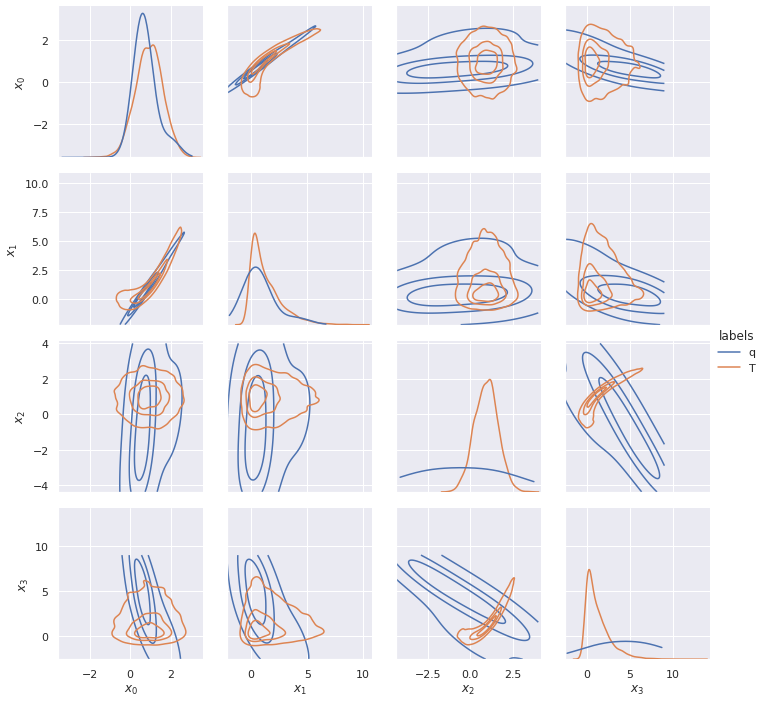

In [15]:

sns_pairplot(q_samples[:, 0:4], q_weights, truth_x[:, 0:4], levels=4, 
             out_name='./dla_figs/banana_32d_30layers_final_q_weighted.png')

     labels     $x_0$     $x_1$     $x_2$     $x_3$
0         q  0.189934 -0.150866  0.063096 -0.249184
1         q -1.270740  1.683461  1.396888  1.957123
2         q  1.513095  2.284403  0.859803  0.717231
3         q  1.148395  1.314163  1.304380  1.672712
4         q  1.078479  1.178649  1.310326  1.712921
...     ...       ...       ...       ...       ...
4059      T  1.351736  1.613957  0.191566  0.076168
4060      T  0.738764  0.674279  0.606173  0.377740
4061      T  0.628482  0.432070  0.818790  0.789990
4062      T  1.198671  1.259571  1.020987  0.701010
4063      T  0.868955  0.876340  0.588045  0.172888

[4064 rows x 5 columns]


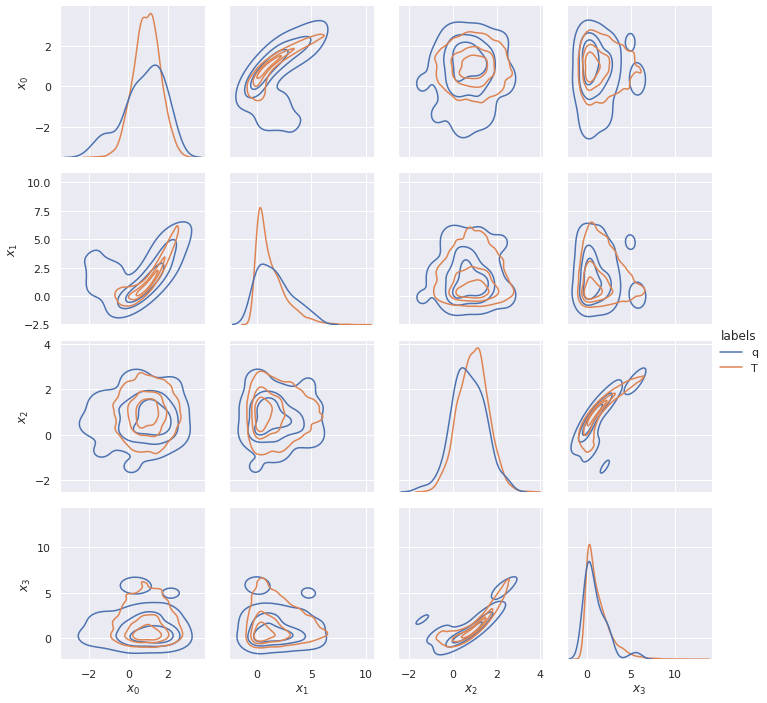

In [11]:
sns_pairplot(q_samples[:,0:4], np.ones(len(q_samples)), truth_x[:,0:4], levels=4, 
             out_name='./dla_figs/banana_32d_30layers_final_q_unweighted.png')

In [12]:
dla_samples = trace['mh_samples'][0]
dla_samples.keys()

#np.savetxt('./fiducial_samples/dla_samples_32d_banana_iter7.txt', dla_samples['burnin_7'])

dict_keys(['init_0', 'burnin_0', 'burnin_1', 'burnin_2', 'burnin_3', 'burnin_4', 'burnin_5', 'burnin_6', 'burnin_7', 'burnin_8', 'post_burnin_0', 'DLA_1', 'DLA_2', 'DLA_3', 'DLA_4', 'DLA_5', 'DLA_6', 'DLA_7', 'DLA_8', 'DLA_9', 'DLA_10', 'DLA_11', 'DLA_12', 'DLA_13', 'DLA_14', 'DLA_15', 'DLA_16', 'DLA_17', 'DLA_18', 'DLA_19', 'DLA_20', 'DLA_21', 'DLA_22', 'DLA_23', 'DLA_24', 'DLA_25', 'DLA_26', 'DLA_27', 'DLA_28', 'DLA_29', 'DLA_30', 'DLA_31', 'DLA_32', 'DLA_33', 'DLA_34', 'DLA_35', 'DLA_36', 'DLA_37', 'DLA_38', 'DLA_39', 'DLA_40', 'DLA_41', 'DLA_42', 'DLA_43', 'DLA_44', 'DLA_45', 'DLA_46', 'DLA_47', 'DLA_48', 'DLA_49', 'DLA_50', 'DLA_51', 'DLA_52', 'DLA_53', 'DLA_54', 'DLA_55', 'DLA_56', 'DLA_57', 'DLA_58', 'DLA_59', 'DLA_60', 'DLA_61', 'DLA_62', 'DLA_63', 'DLA_64', 'DLA_65', 'DLA_66', 'DLA_67', 'DLA_68', 'DLA_69', 'DLA_70', 'DLA_71', 'DLA_72', 'DLA_73', 'DLA_74', 'DLA_75', 'DLA_76', 'DLA_77', 'DLA_78', 'DLA_79', 'DLA_80', 'DLA_81', 'DLA_82', 'DLA_83', 'DLA_84', 'DLA_85', 'DLA_86', 'DL

     labels     $x_0$     $x_1$     $x_2$     $x_3$
0         q  0.207138 -0.081392  0.053617 -0.288123
1         q -1.601740  2.625574  1.312049  1.731788
2         q  1.508934  2.285117  0.847032  0.717778
3         q  1.179898  1.403537  1.169802  1.379887
4         q  1.109710  1.232932  1.189088  1.418997
...     ...       ...       ...       ...       ...
4059      T  1.351736  1.613957  0.191566  0.076168
4060      T  0.738764  0.674279  0.606173  0.377740
4061      T  0.628482  0.432070  0.818790  0.789990
4062      T  1.198671  1.259571  1.020987  0.701010
4063      T  0.868955  0.876340  0.588045  0.172888

[4064 rows x 5 columns]


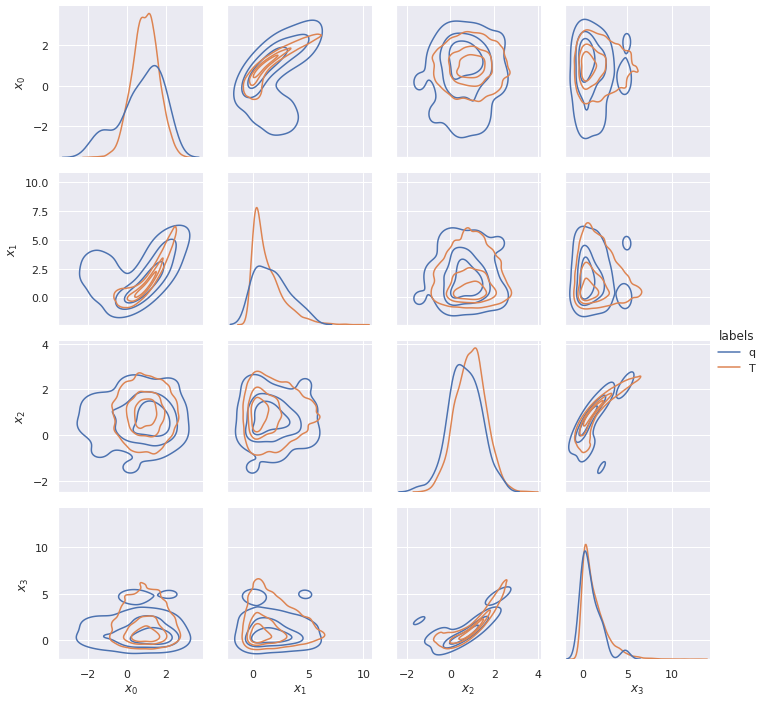

In [14]:
#fkey = list(dla_samples.keys())[-10]

fkey = 'DLA_150'
sns_pairplot(dla_samples[fkey][:, 0:4], np.ones(len(dla_samples[fkey])), truth_x[:,0:4], levels=4,
             out_name='./dla_figs/banana_32d_30layers_final_dla_samples.png')

In [28]:
llk = jax.vmap(lambda x: log_like(x))(jnp.asarray(dla_samples[fkey]))
lpr = jax.vmap(lambda x: log_prior(x))(jnp.asarray(dla_samples[fkey]))

q_key = 'DLA_1'
q_models = trace['dla_q_models'][0]

logq = q_models[q_key].logq(torch.tensor(np.asarray(dla_samples[fkey]), dtype=torch.float32))
logq = logq.detach().numpy()
logp = llk + lpr
logw = logp - logq

fkey = 'DLA_100'

logw = np.copy(np.asarray(logw))
az_logw, _ = az.psislw(logw)
iw = np.exp(az_logw)

sns_pairplot(dla_samples[fkey][:, 0:2], np.ones(len(iw)), truth_x[:,0:2], levels=4)

KeyError: 'DLA_100'

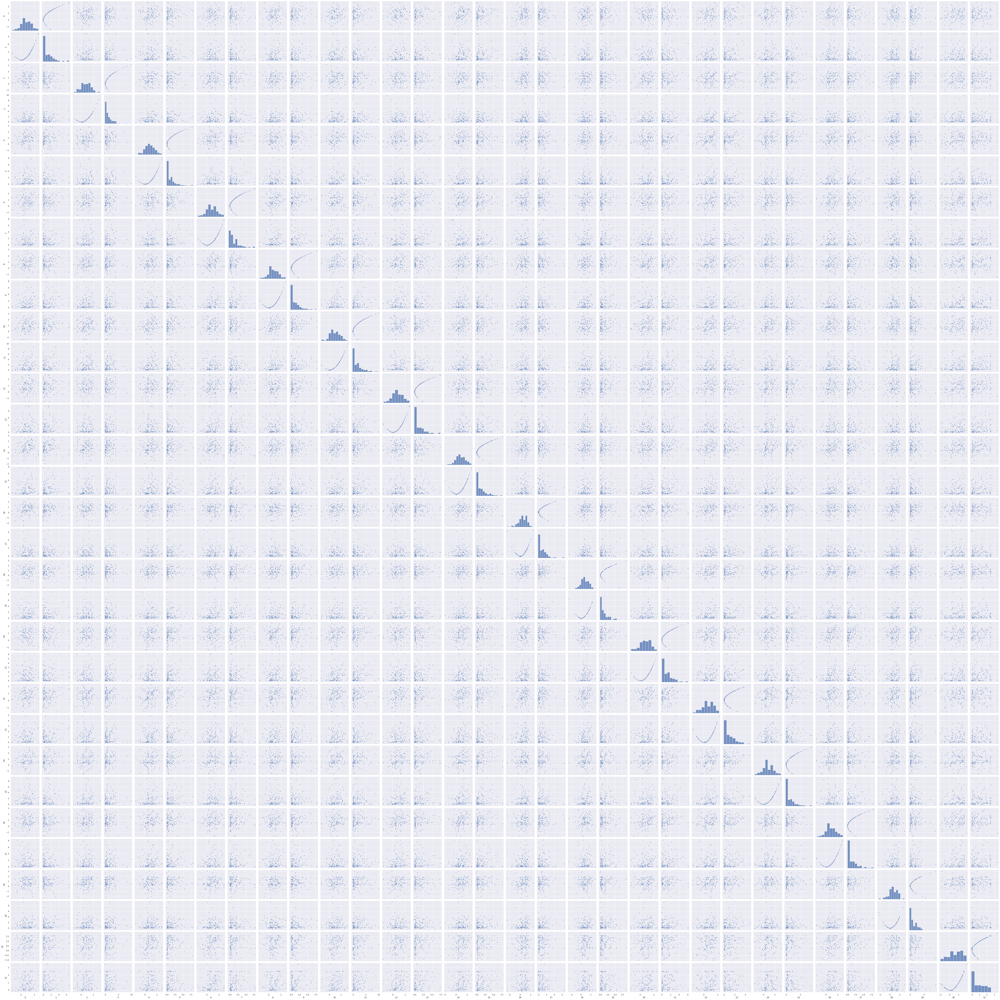

In [32]:
df = pd.DataFrame(np.asarray(dla_samples[fkey]))
sns.pairplot(df, plot_kws={'s': 10})

     labels     $x_0$     $x_1$
0         q -0.040839  2.907344
1         q -2.635837  1.810265
2         q -1.547681  0.084477
3         q  1.104138 -0.354373
4         q  1.536837  4.298095
...     ...       ...       ...
4123      T  1.351736  1.613957
4124      T  0.738764  0.674279
4125      T  0.628482  0.432070
4126      T  1.198671  1.259571
4127      T  0.868955  0.876340

[4128 rows x 3 columns]


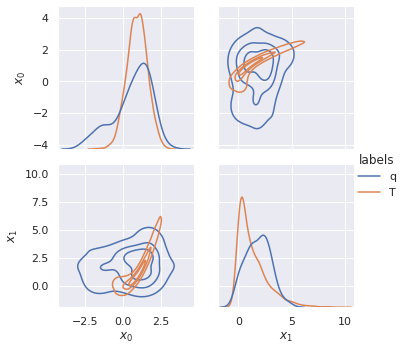

In [23]:
q_key = 'DLA_50'
q_models = trace['dla_q_models'][0]

qi = q_models[q_key]
q_samples = qi.sample(128)
logq = qi.logq(q_samples)
q_samples, logq = q_samples.detach().numpy(), logq.detach().numpy()
mag = np.linalg.norm(q_samples, axis=1)
#q_samples = q_samples[mag < 15]
#logq = logq[mag < 15]
#iw = jax.vmap(lambda x: log_like(x))(q_samples)
#print(jnp.asarray(q_samples))
llk = jax.vmap(lambda x: log_like(x))(jnp.asarray(q_samples))
lpr = jax.vmap(lambda x: log_prior(x))(jnp.asarray(q_samples))
logp = llk + lpr
logw = logp - logq

logw = np.copy(np.asarray(logw))
#print(logw)
az_logw, _ = az.psislw(logw)
iw = np.exp(az_logw)
#print(az_iw[az_iw!=0])
#print(np.amax(az_iw))

'''
logw = np.clip(logw, a_min=-np.inf, a_max=logsumexp(logw) - 0.25 * np.log(len(logw)))

logw -= logsumexp(logw)
iw = np.exp(logw)
iw /= np.sum(iw)
'''

#print(iw)

#iw = np.clip(iw, a_min=0, a_max=np.mean(iw)*len(iw)**0.5)
sns_pairplot(q_samples[:, 0:2], np.ones(len(q_samples)), truth_x[:, 0:2], levels=4)

     labels     $x_0$     $x_1$
0         q  0.845778  1.885218
1         q -0.038387  1.732885
2         q  1.379034  3.683084
3         q  1.163502  5.873837
4         q  0.662006  2.535940
...     ...       ...       ...
4123      T  1.847756  3.559490
4124      T -0.045830  0.053424
4125      T  1.647241  2.634757
4126      T  1.633867  3.039001
4127      T  1.041258  1.046355

[4128 rows x 3 columns]


ValueError: Contour levels must be increasing

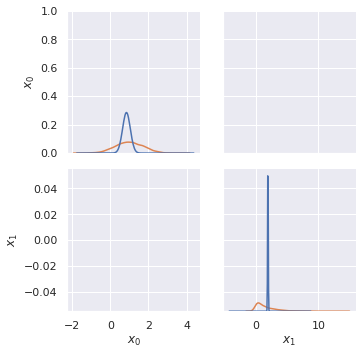

In [17]:
sns_pairplot(q_samples[:, 0:2], iw, truth_x[:, 0:2], levels=4)

In [41]:
beta = 1

x_prime = np.random.normal(0, 1, size=(2000, D))
x_prime[:, 0] = x_prime[:, 0] * a / np.sqrt(beta)
x_prime[:, 1:] = x_prime[:, 1:] * np.exp(b * x_prime[:, 0]).reshape((2000, 1)) / np.sqrt(beta)

for key in list(q_models.keys()):

    # There were 10 temperature levels. q10_w corresponds to the q fit at beta=1 i.e. the target.
    qi = q_models[key]
    q_samples, logq = qi.sample(2000, device='cpu')
    q_samples, logq = q_samples.numpy(), logq.numpy()
    iw = jax.vmap(lambda x: log_like(x))(q_samples)
    logp = jax.vmap(lambda x: log_like(x))(q_samples)
    logw = logp - logq
    logw -= logsumexp(logw)
    iw = np.exp(logw)
    iw /= np.sum(iw)
    
    sns_pairplot(q_samples[:, 0:4], iw, x_prime[:, 0:4], levels=4, 
                 out_name=f'./dla_figs/funnel_16d_{key}_20layers.png')

NameError: name 'D' is not defined

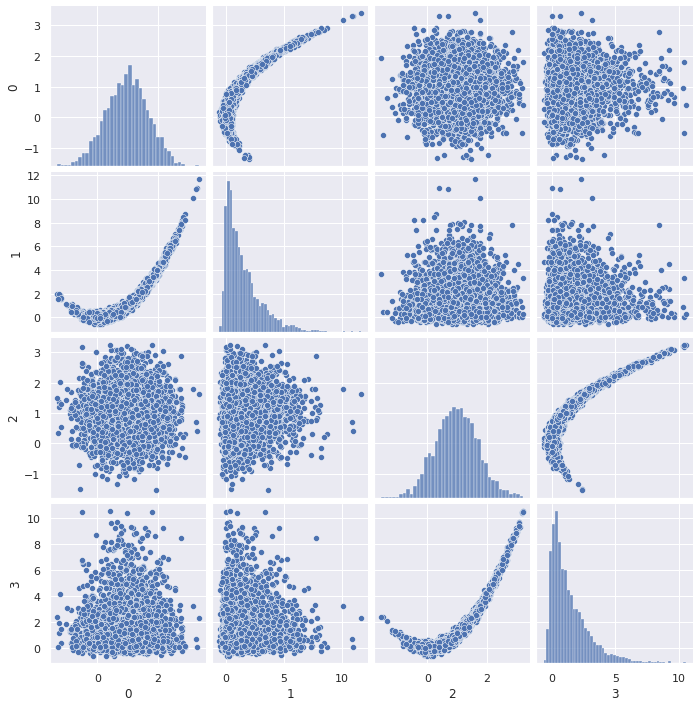

In [15]:
df = pd.DataFrame(truth_x[:, 0:4])
sns.pairplot(df)

# Check MH updates ...

In [15]:
def mh_update_check(dla_samples, q_model):
    '''
    This function should sanity check the MH acceptance procedure ...
    '''
    
    llk_current = jax.vmap(lambda x: log_like(x))(dla_samples)
    lpr_current = jax.vmap(lambda x: log_prior(x))(dla_samples)
    logp_current = llk_current + lpr_current
    logq_current = q_model.logq(torch.tensor(np.asarray(dla_samples), dtype=torch.float32))
    
    prop_samples = q_model.sample(len(dla_samples))
    logq_prop = q_model.logq(prop_samples)
    prop_samples = jnp.asarray(prop_samples.detach().numpy())
    llk_prop = jax.vmap(lambda x: log_like(x))(prop_samples)
    lpr_prop = jax.vmap(lambda x: log_prior(x))(prop_samples)
    logp_prop = llk_prop + lpr_prop
    
    log_alpha = logp_prop + logq_current - logp_current - logq_current
    alpha = jnp.exp(log_alpha)
    
    print(f'log_alpha = {log_alpha}')
    print(f'alpha = {alpha}')
    print(f'logp_current = {logp_current}')
    print(f'logq_current = {logq_current}')
    print(f'logp_prop = {logp_prop}')
    print(f'logq_prop = {logq_prop}')

# Nice plots for visualizing the DLA updates ...

In [48]:
dla_samples = trace['dla_samples'][0]
mh_samples = trace['mh_samples'][0]

In [49]:
def quiver_plot(init_samples, dla_updates, mh_updates, truth=None, q_samples=None, levels=4, out_name=None,
                figsize=(2 * 8.09, 2 * 5.0), markersize=10):
    
    dla_diff = dla_updates - init_samples

    mh_changed = np.where(dla_updates != mh_updates)[0]
    mh_updates = mh_updates[mh_changed]
    mh_diff = mh_updates - dla_updates[mh_changed]
    
    plt.figure(figsize=figsize)
    sns.set_theme()
    sns.scatterplot(init_samples[:, 0], init_samples[:, 1], label='Initial Positions', color='#332288',
                    marker="o", s=markersize)
    sns.scatterplot(dla_updates[:, 0], dla_updates[:, 1], label='DLA updates', color='#117733',
                    marker="v", s=markersize)
    sns.scatterplot(mh_updates[:, 0], mh_updates[:, 1], label='MH updates', color='#999933',
                    marker="D", s=markersize)
    plt.quiver(init_samples[:, 0], init_samples[:, 1], dla_diff[:, 0], dla_diff[:, 1], angles='xy',
               alpha=0.5, scale_units='xy', scale=1, color='#88CCEE', label='DLA vector')
    plt.quiver(dla_updates[:, 0][mh_changed], dla_updates[:, 1][mh_changed], mh_diff[:, 0], 
               mh_diff[:, 1], angles='xy', alpha=0.5, scale_units='xy', scale=1, color='#44AA99', 
               label='MH vector')
    if truth is not None:
        sns.kdeplot(truth[:, 0], truth[:, 1], label='Target', alpha=0.5, color='#DDCC77', levels=levels)
    if q_samples is not None:
        sns.kdeplot(q_samples[:, 0], q_samples[:, 1], label='q', alpha=0.5, color='#AA4499', levels=levels)
    plt.legend(loc=2, bbox_to_anchor=(1, 1))
    if out_name is not None:
        plt.savefig(out_name, bbox_inches='tight')

/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

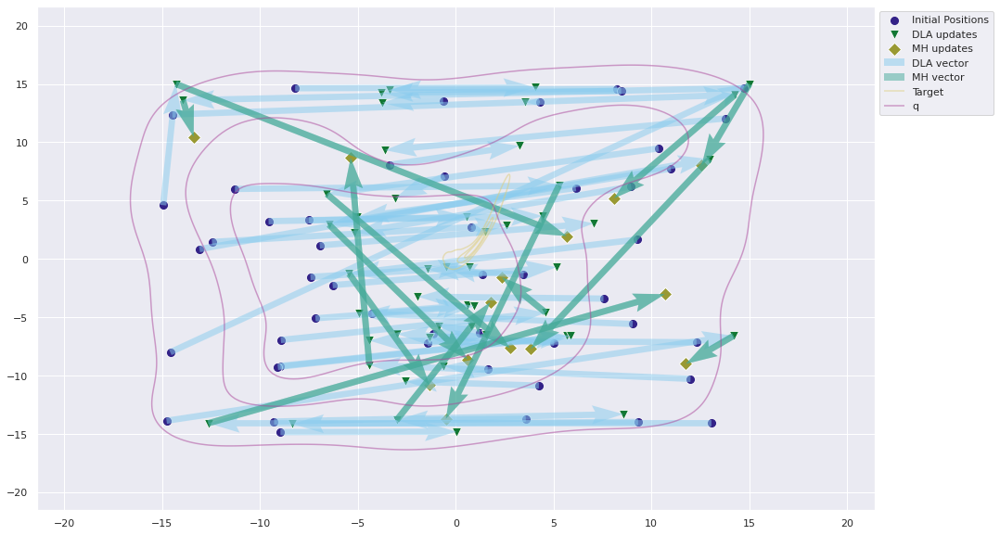

In [50]:
q = trace['dla_qmodels'][0]['burnin_0']
qx, _ = q.sample(2000, device='cpu')
qx = qx.numpy()

quiver_plot(jax_prior_init, dla_samples['burnin_0'], mh_samples['burnin_0'], truth_x[:,0:2], qx, markersize=100)

init_key = prior
Current key = burnin_0
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_0
Current key = burnin_1
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_1
Current key = burnin_2
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_2
Current key = burnin_3
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_3
Current key = burnin_4
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_4
Current key = burnin_5
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_5
Current key = burnin_6
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_6
Current key = burnin_7
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_7
Current key = burnin_8
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_8
Current key = burnin_9
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_9
Current key = burnin_10
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_10
Current key = burnin_11
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_11
Current key = burnin_12
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_12
Current key = burnin_13
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_13
Current key = burnin_14
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_14
Current key = burnin_15
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_15
Current key = burnin_16
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_16
Current key = burnin_17
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_17
Current key = burnin_18
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_18
Current key = burnin_19
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_19
Current key = burnin_20
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


<ipython-input-49-25f651bbdca4>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpreta

init_key = burnin_20
Current key = burnin_21
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_21
Current key = burnin_22
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_22
Current key = burnin_23
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_23
Current key = burnin_24
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_24
Current key = burnin_25
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_25
Current key = burnin_26
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_26
Current key = burnin_27
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_27
Current key = burnin_28
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_28
Current key = burnin_29
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_29
Current key = burnin_30
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_30
Current key = burnin_31
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_31
Current key = burnin_32
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_32
Current key = burnin_33
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_33
Current key = burnin_34
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_34
Current key = burnin_35
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_35
Current key = burnin_36
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_36
Current key = burnin_37
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_37
Current key = burnin_38
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_38
Current key = burnin_39
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_39
Current key = burnin_40
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_40
Current key = burnin_41
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_41
Current key = burnin_42
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_42
Current key = burnin_43
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_43
Current key = burnin_44
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_44
Current key = burnin_45
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_45
Current key = burnin_46
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_46
Current key = burnin_47
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_47
Current key = burnin_48
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_48
Current key = burnin_49
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_49
Current key = burnin_50
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_50
Current key = burnin_51
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_51
Current key = burnin_52
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_52
Current key = burnin_53
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_53
Current key = burnin_54
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_54
Current key = burnin_55
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_55
Current key = burnin_56
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_56
Current key = burnin_57
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_57
Current key = burnin_58
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_58
Current key = burnin_59
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_59
Current key = burnin_60
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_60
Current key = burnin_61
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_61
Current key = burnin_62
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_62
Current key = burnin_63
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_63
Current key = burnin_64
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_64
Current key = burnin_65
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_65
Current key = burnin_66
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_66
Current key = burnin_67
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_67
Current key = burnin_68
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_68
Current key = burnin_69
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_69
Current key = burnin_70
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_70
Current key = burnin_71
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_71
Current key = burnin_72
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_72
Current key = burnin_73
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_73
Current key = burnin_74
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_74
Current key = burnin_75
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_75
Current key = burnin_76
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_76
Current key = burnin_77
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = burnin_77
Current key = burnin_78
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = post_burnin_0
Current key = DLA_1
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = DLA_1
Current key = DLA_2
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

init_key = DLA_2
Current key = DLA_3
shape init = (50, 2)
shape dla = (50, 2)
shape mh = (50, 2)


/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/richard/anaconda3/envs/jax/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misi

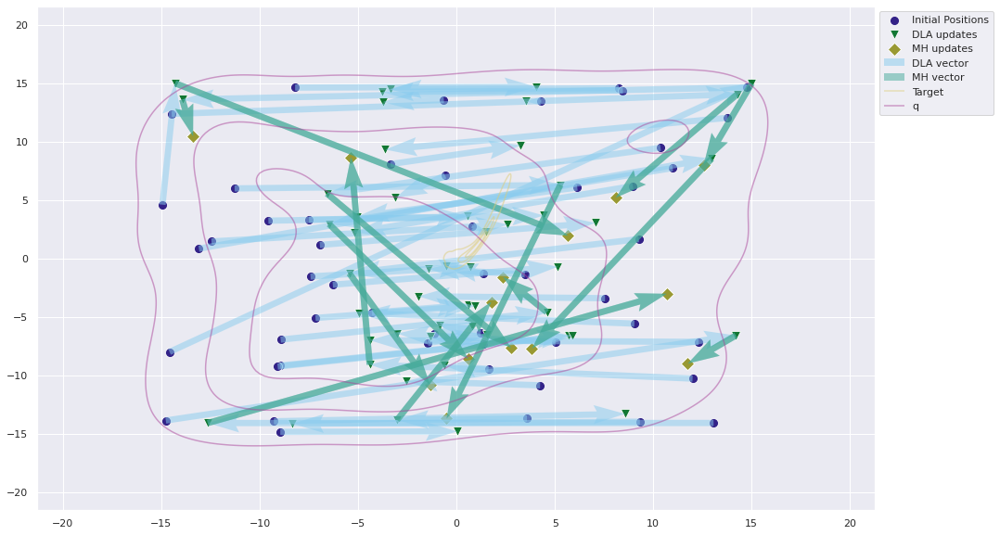

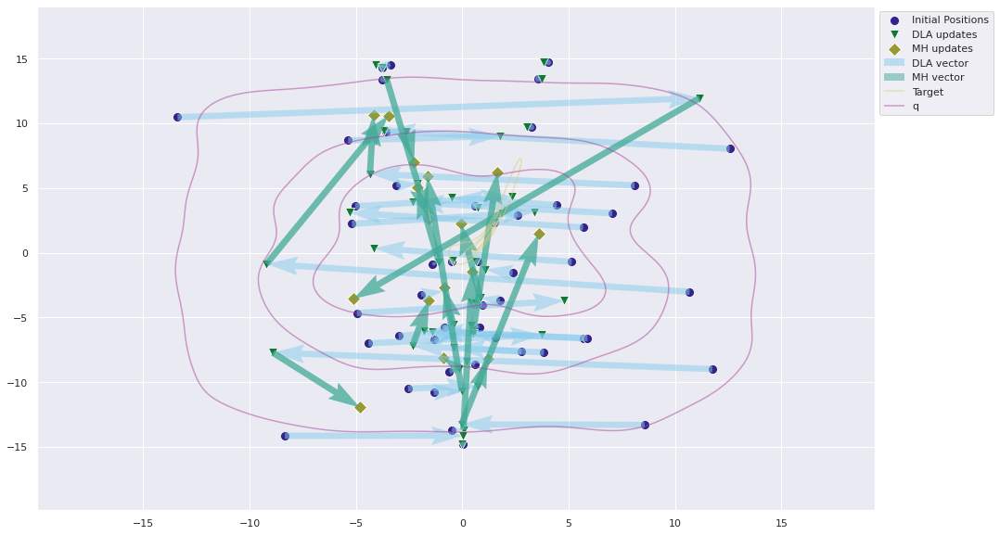

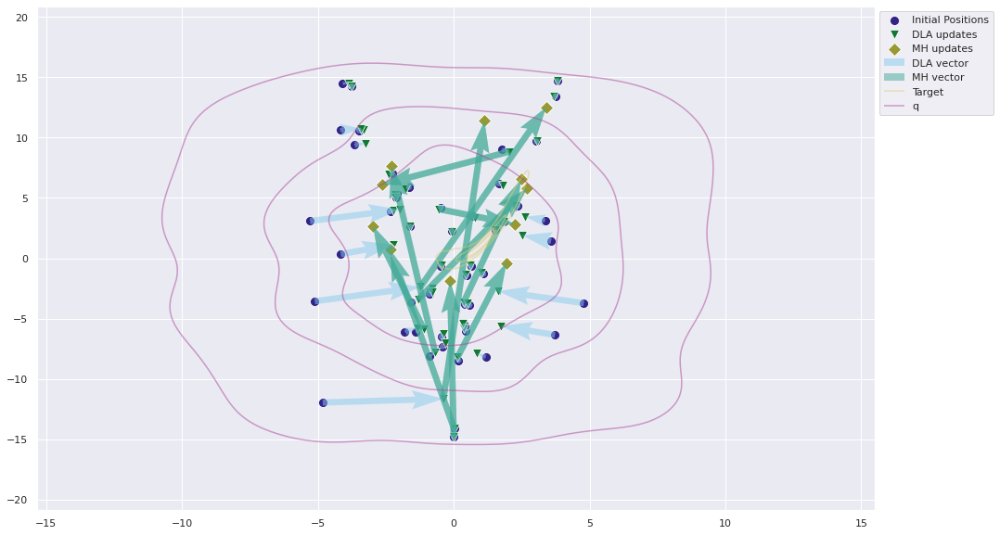

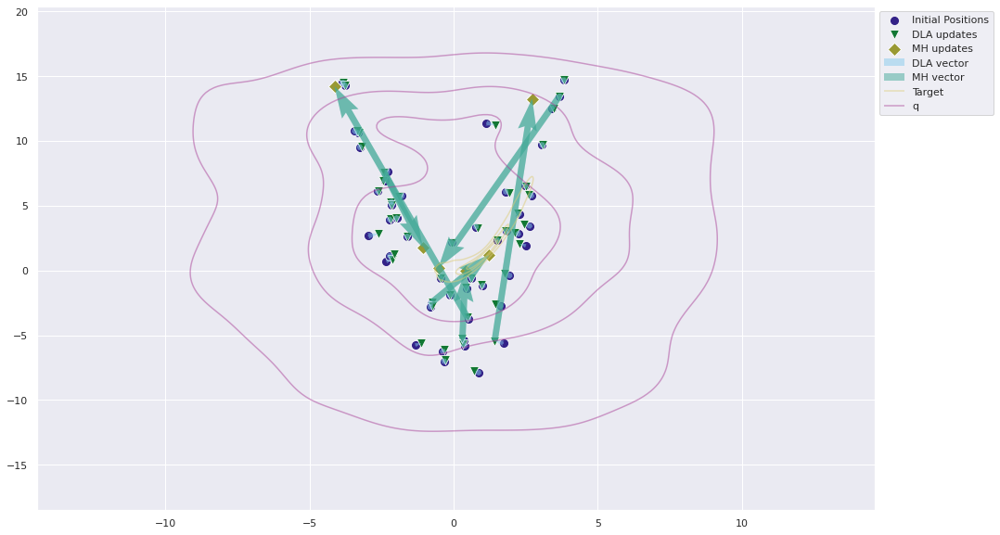

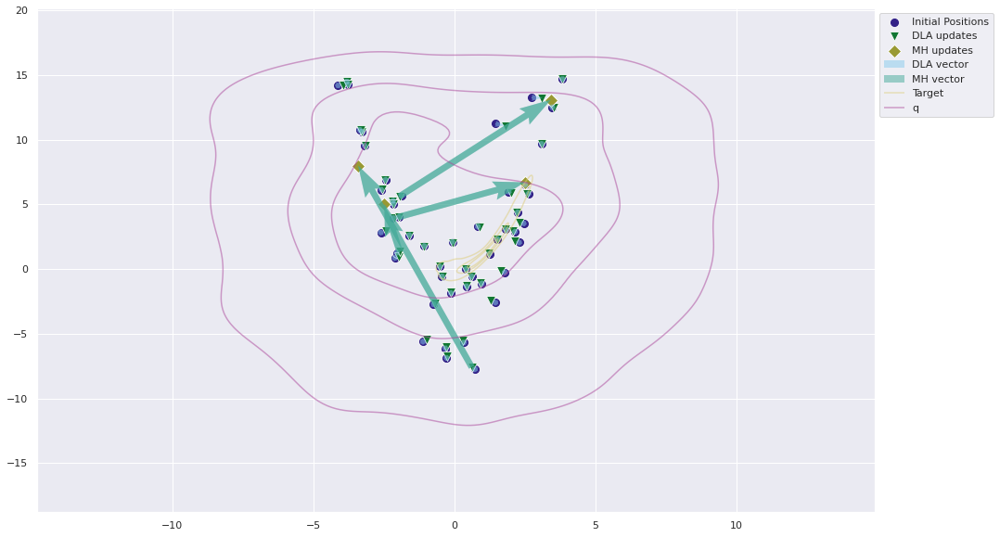

...

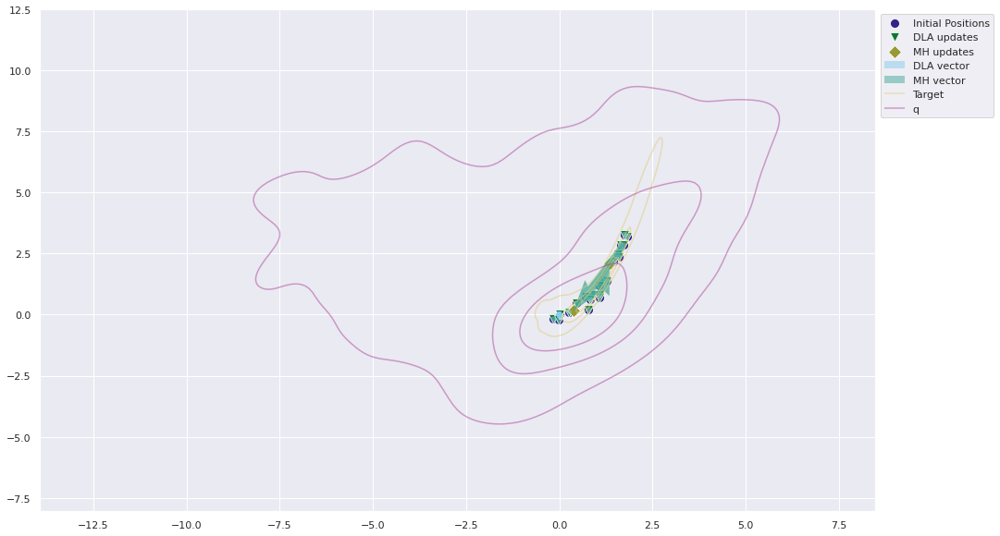

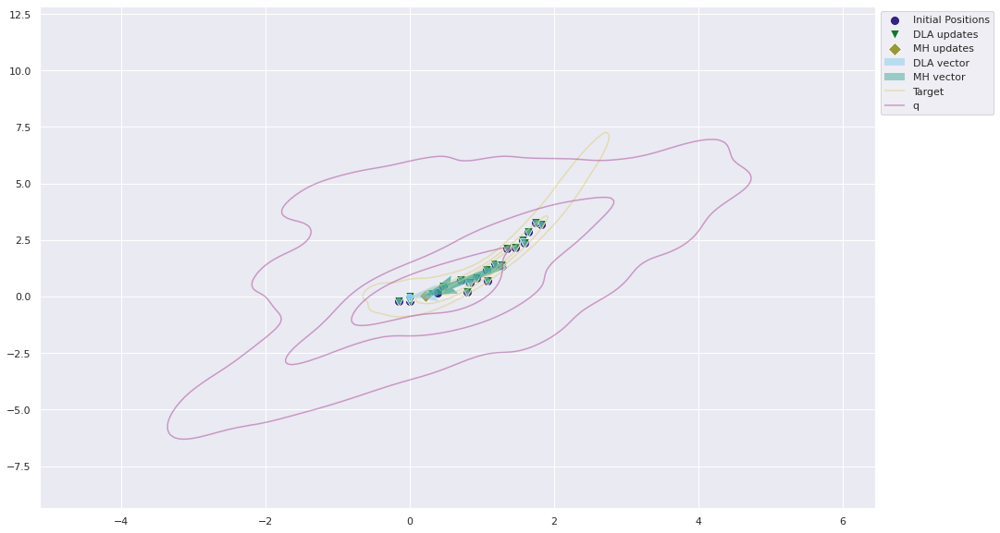

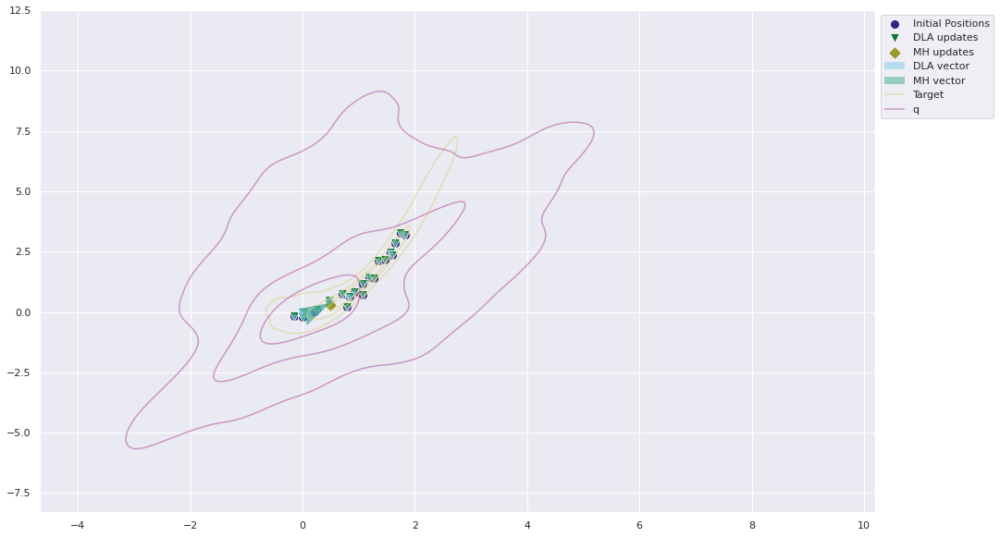

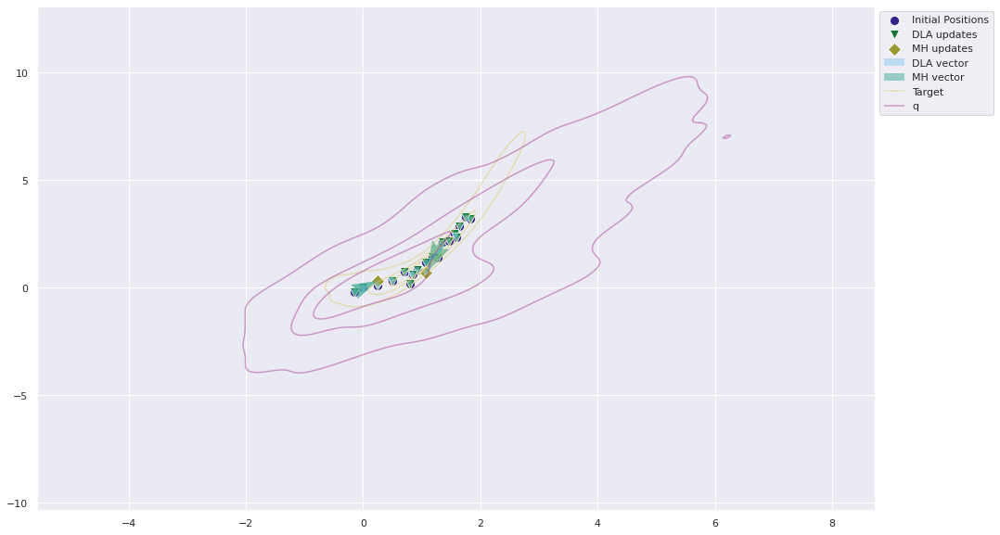

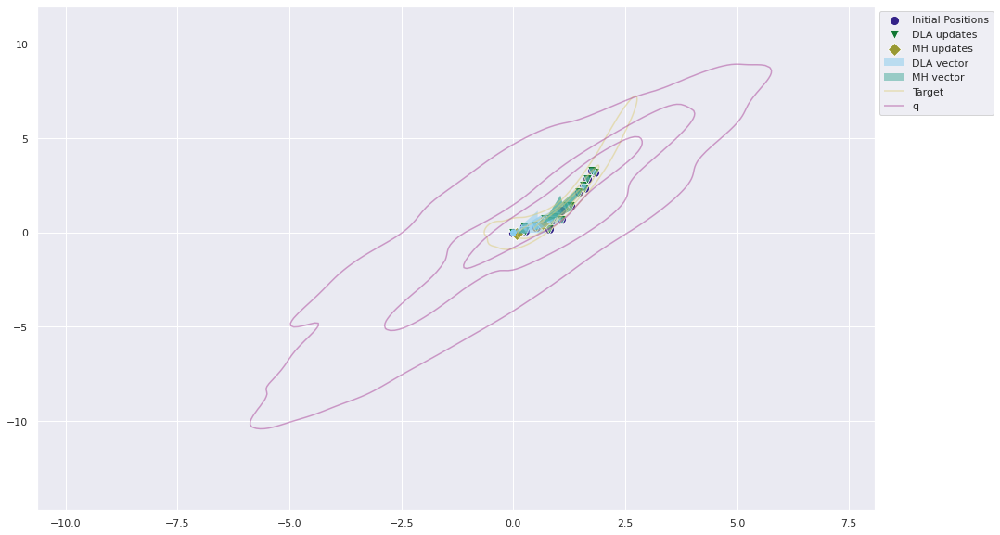

In [51]:
dla_samples = trace['dla_samples'][0]
mh_samples = trace['mh_samples'][0]
dla_keys = list(dla_samples.keys())



for i, key in enumerate(dla_keys):
    
    if key == 'post_burnin_0':
        continue
    
    if i == 0:
        print('init_key = prior')
        initial_samples = jax_prior_init
    elif i > 0:
        print(f'init_key = {dla_keys[i - 1]}')
        initial_samples = mh_samples[dla_keys[i - 1]]

    print(f'Current key = {key}')
    dla_updates = dla_samples[key]
    mh_updates = mh_samples[key]
    
    print(f'shape init = {np.shape(initial_samples)}')
    print(f'shape dla = {np.shape(dla_updates)}')
    print(f'shape mh = {np.shape(mh_updates)}')
    
    q = trace['dla_qmodels'][0][key]
    qx, _ = q.sample(2000, device='cpu')
    qx = qx.numpy()
    
    quiver_plot(initial_samples, dla_updates, mh_updates, truth_x[:,0:2], qx, markersize=100,
                levels=4, out_name=f'./dla_figs/banana_dla_iteration_{key}.png')

# Sanity ...


In [5]:
x=np.loadtxt('/home/richard/nfmc_jax_tests/fiducial_samples/prior_dla_samples.txt')

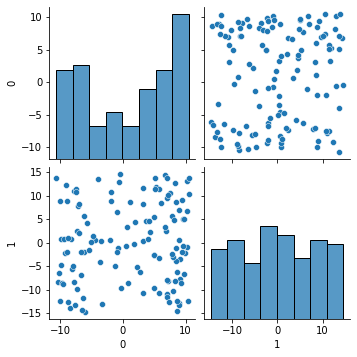

In [6]:
sns.pairplot(pd.DataFrame(x[:,0:2]))

In [7]:
jnp.shape(x)


(128, 32)